# **Homework 1: COVID-19 Cases Prediction (Regression)**

Objectives:
* Solve a regression problem with deep neural networks (DNN).
* Understand basic DNN training tips.
* Familiarize yourself with PyTorch.

If you have any questions, please contact the TAs via TA hours, NTU COOL, or email to mlta-2022-spring@googlegroups.com

# Download data
If the Google Drive links below do not work, you can download data from [Kaggle](https://www.kaggle.com/t/a3ebd5b5542f0f55e828d4f00de8e59a), and upload data manually to the workspace.

In [ ]:
!gdown --id '1kLSW_-cW2Huj7bh84YTdimGBOJaODiOS' --output covid.train.csv
!gdown --id '1iiI5qROrAhZn-o4FPqsE97bMzDEFvIdg' --output covid.test.csv

# Import packages

In [1]:
# Numerical Operations
import math
import numpy as np

# Reading/Writing Data
import pandas as pd
import os
import csv

# For Progress Bar
from tqdm import tqdm

# Pytorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

# For plotting learning curve
# from torch.utils.tensorboard import SummaryWriter

# Feature analysis
import seaborn as sns

In [2]:
train_ana, test_ana = pd.read_csv('./covid.train.csv'), pd.read_csv('./covid.test.csv')
# correlation
correlation = train_ana.iloc[:, 38:].corr().iloc[-1]
correlation

cli                   0.852766
ili                   0.852934
hh_cmnty_cli          0.880777
nohh_cmnty_cli        0.873750
wearing_mask         -0.135891
                        ...   
public_transit.4     -0.415122
anxious.4             0.631444
depressed.4           0.493094
worried_finances.4    0.317566
tested_positive.4     1.000000
Name: tested_positive.4, Length: 80, dtype: float64

         features  correlation_value
0             cli           0.852766
1             ili           0.852934
2    hh_cmnty_cli           0.880777
3  nohh_cmnty_cli           0.873750
4    wearing_mask          -0.135891


<Axes: xlabel='correlation_value', ylabel='Count'>

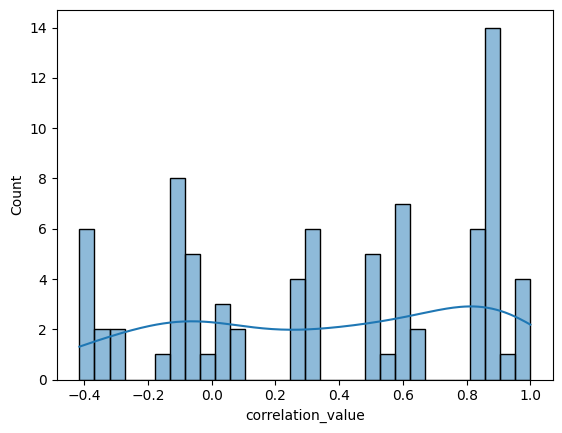

In [3]:
corr_pic = pd.DataFrame(correlation).reset_index()
corr_pic.rename(columns={'index': 'features', 'tested_positive.4': 'correlation_value'}, inplace=True)
print(corr_pic.head())
sns.histplot(data=corr_pic, x="correlation_value",bins=30, kde=True)

In [4]:
# select correlation larger than 0.5
corr_feature = corr_pic[abs(corr_pic['correlation_value']) >= 0.]

train_ana[list(corr_feature['features'])].head().mean(axis=0)


cli                    0.923610
ili                    0.949030
hh_cmnty_cli          13.905571
nohh_cmnty_cli         9.787010
wearing_mask          63.529580
                        ...    
public_transit.4       4.805801
anxious.4             10.275811
depressed.4            8.847680
worried_finances.4    34.721653
tested_positive.4     10.475699
Length: 80, dtype: float64

# Some Utility Functions

You do not need to modify this part.

In [5]:
def same_seed(seed):
    '''Fixes random number generator seeds for reproducibility.'''
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

def train_valid_split(data_set, valid_ratio, seed):
    '''Split provided training data into training set and validation set'''
    valid_set_size = int(valid_ratio * len(data_set))
    train_set_size = len(data_set) - valid_set_size
    train_set, valid_set = random_split(data_set, [train_set_size, valid_set_size], generator=torch.Generator().manual_seed(seed))
    return np.array(train_set), np.array(valid_set)

def predict(test_loader, model, device):
    model.eval() # Set your model to evaluation mode.
    preds = []
    for x in tqdm(test_loader):
        x = x.to(device)
        with torch.no_grad():
            pred = model(x)
            preds.append(pred.detach().cpu())
    preds = torch.cat(preds, dim=0).numpy()
    return preds

# Dataset

In [6]:
class COVID19Dataset(Dataset):
    '''
    x: Features.
    y: Targets, if none, do prediction.
    '''
    def __init__(self, x, y=None):
        if y is None:
            self.y = y
        else:
            self.y = torch.FloatTensor(y)
        self.x = torch.FloatTensor(x)

    def __getitem__(self, idx):
        if self.y is None:
            return self.x[idx]
        else:
            return self.x[idx], self.y[idx]

    def __len__(self):
        return len(self.x)

# Neural Network Model
Try out different model architectures by modifying the class below.

In [7]:
class My_Model(nn.Module):
    def __init__(self, input_dim):
        super(My_Model, self).__init__()
        # TODO: modify model's structure, be aware of dimensions.
        self.layers = nn.Sequential(
            nn.Linear(input_dim, 32),
            nn.LeakyReLU(0.2),
            nn.Linear(32, 16),
            nn.LeakyReLU(0.2),
            nn.Linear(16, 8),
            nn.LeakyReLU(0.2),
            nn.Linear(8, 1)
        )

    def forward(self, x):
        x = self.layers(x)
        x = x.squeeze(1) # (B, 1) -> (B)
        return x

# Feature Selection
Choose features you deem useful by modifying the function below.

In [18]:
def select_feat(train_data, valid_data, test_data, select_all=True):
    '''Selects useful features to perform regression'''
    y_train, y_valid = train_data[:,-1], valid_data[:,-1]
    raw_x_train, raw_x_valid, raw_x_test = train_data[:,:-1], valid_data[:,:-1], test_data

    # normlizition on train and test
    # all_data = np.concatenate((raw_x_train, raw_x_valid), axis=0)
    # all_data = np.concatenate((raw_x_train, raw_x_valid, raw_x_test), axis=0)
    # maxa = all_data.max(axis=0)
    # mina = all_data.min(axis=0)
    # raw_x_train = (raw_x_train - mina) / (maxa-mina)
    # raw_x_valid = (raw_x_valid - mina) / (maxa-mina)
    # raw_x_test = (raw_x_test - mina) / (maxa-mina)
    # raw_x_test = (raw_x_test - raw_x_test.min(axis=0)) / (raw_x_test.max(axis=0)-raw_x_test.min(axis=0))

    # seperate normalize
    # raw_x_train = (raw_x_train - raw_x_train.mean(axis=0)) / raw_x_train.std(axis=0)
    # raw_x_valid = (raw_x_valid - raw_x_valid.mean(axis=0)) / raw_x_valid.std(axis=0)
    # raw_x_test = (raw_x_test - raw_x_test.mean(axis=0)) / raw_x_test.std(axis=0)

    # std and mean
    # mean = all_data.mean(axis=0)
    # std = all_data.std(axis=0)
    # raw_x_train = (raw_x_train - mean) / std
    # raw_x_valid = (raw_x_valid - mean) / std
    # raw_x_test = (raw_x_test - mean) / std

    if select_all:
        feat_idx = list(range(raw_x_train.shape[1]))
    else:
        # feat_idx = [0,1,2,3,4] # TODO: Select suitable feature columns.
        feat_idx = list(range(38, raw_x_train.shape[1]))

    return raw_x_train[:,feat_idx], raw_x_valid[:,feat_idx], raw_x_test[:,feat_idx], y_train, y_valid

# Training Loop

In [19]:
def trainer(train_loader, valid_loader, model, config, device):

    criterion = nn.MSELoss(reduction='mean') # Define your loss function, do not modify this.

    # Define your optimization algorithm.
    # TODO: Please check https://pytorch.org/docs/stable/optim.html to get more available algorithms.
    # TODO: L2 regularization (optimizer(weight decay...) or implement by your self).
    optimizer = torch.optim.SGD(model.parameters(), lr=config['learning_rate'], momentum=0.9, weight_decay=1e-4)
    # optimizer = torch.optim.RAdam(model.parameters(), lr=config['learning_rate'])

    # writer = SummaryWriter() # Writer of tensoboard.

    if not os.path.isdir('./models'):
        os.mkdir('./models') # Create directory of saving models.

    n_epochs, best_loss, step, early_stop_count = config['n_epochs'], math.inf, 0, 0

    for epoch in range(n_epochs):
        model.train() # Set your model to train mode.
        loss_record = []

        # tqdm is a package to visualize your training progress.
        # train_pbar = tqdm(train_loader, position=0, leave=True)

        for x, y in train_loader:
            optimizer.zero_grad()               # Set gradient to zero.
            x, y = x.to(device), y.to(device)   # Move your data to device.
            pred = model(x)
            loss = criterion(pred, y)
            loss.backward()                     # Compute gradient(backpropagation).
            optimizer.step()                    # Update parameters.
            step += 1
            loss_record.append(loss.detach().item())

            # Display current epoch number and loss on tqdm progress bar.
            # train_pbar.set_description(f'Epoch [{epoch+1}/{n_epochs}]')
            # train_pbar.set_postfix({'loss': loss.detach().item()})

        mean_train_loss = sum(loss_record)/len(loss_record)
        # writer.add_scalar('Loss/train', mean_train_loss, step)

        model.eval() # Set your model to evaluation mode.
        loss_record = []
        for x, y in valid_loader:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                pred = model(x)
                loss = criterion(pred, y)

            loss_record.append(loss.item())

        mean_valid_loss = sum(loss_record)/len(loss_record)
        # print(f'Epoch [{epoch+1}/{n_epochs}]: Train loss: {mean_train_loss:.4f}, Valid loss: {mean_valid_loss:.4f}')
        # writer.add_scalar('Loss/valid', mean_valid_loss, step)

        if mean_valid_loss < best_loss:
            best_loss = mean_valid_loss
            torch.save(model.state_dict(), config['save_path']) # Save your best model
            print(f'Epoch [{epoch+1}/{n_epochs}]: Saving model with valid loss {best_loss:.3f}...and train loss {mean_train_loss:.3f}...')
            early_stop_count = 0
        else:
            early_stop_count += 1

        if early_stop_count >= config['early_stop']:
            print('\nModel is not improving, so we halt the training session.')
            return

# Configurations
`config` contains hyper-parameters for training and the path to save your model.

In [20]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
config = {
    'seed': 2025,      # Your seed number, you can pick your lucky number. :)
    'select_all': True,   # Whether to use all features.
    'valid_ratio': 0.2,   # validation_size = train_size * valid_ratio
    'n_epochs': 3000,     # Number of epochs.
    'batch_size': 256,
    'learning_rate': 1e-5,
    'early_stop': 600,    # If model has not improved for this many consecutive epochs, stop training.
    'save_path': './models/model.ckpt'  # Your model will be saved here.
}

# Dataloader
Read data from files and set up training, validation, and testing sets. You do not need to modify this part.

In [21]:
# Set seed for reproducibility
same_seed(config['seed'])


# train_data size: 2699 x 118 (id + 37 states + 16 features x 5 days)
# test_data size: 1078 x 117 (without last day's positive rate)
tr_f, te_f = list(corr_feature['features']), list(corr_feature['features'])[:-1]
train_data, test_data = pd.read_csv('./covid.train.csv')[tr_f].values, pd.read_csv('./covid.test.csv')[te_f].values
train_data, valid_data = train_valid_split(train_data, config['valid_ratio'], config['seed'])

# Print out the data size.
print(f"""train_data size: {train_data.shape}
valid_data size: {valid_data.shape}
test_data size: {test_data.shape}""")

# Select features
x_train, x_valid, x_test, y_train, y_valid = select_feat(train_data, valid_data, test_data, config['select_all'])

# Print out the number of features.
print(f'number of features: {x_train.shape[1]}')

train_dataset, valid_dataset, test_dataset = COVID19Dataset(x_train, y_train), \
                                            COVID19Dataset(x_valid, y_valid), \
                                            COVID19Dataset(x_test)

# Pytorch data loader loads pytorch dataset into batches.
train_loader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
valid_loader = DataLoader(valid_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False, pin_memory=True)

train_data size: (2160, 80)
valid_data size: (539, 80)
test_data size: (1078, 79)
number of features: 79


# Start training!

In [22]:
from sklearn.model_selection import KFold

# K-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=config['seed'])
fold_preds = []

# Prepare the full training dataset for K-fold splitting
full_train_dataset = COVID19Dataset(np.concatenate((x_train, x_valid), axis=0), np.concatenate((y_train, y_valid), axis=0))
full_train_data = np.concatenate((x_train, x_valid), axis=0)
full_train_labels = np.concatenate((y_train, y_valid), axis=0)

for fold, (train_idx, valid_idx) in enumerate(kf.split(full_train_data)):
    # print(f"Fold {fold+1}")
    # Create data loaders for the current fold
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_idx)
    valid_subsampler = torch.utils.data.SubsetRandomSampler(valid_idx)

    train_loader_fold = DataLoader(full_train_dataset, batch_size=config['batch_size'], sampler=train_subsampler, pin_memory=True)
    valid_loader_fold = DataLoader(full_train_dataset, batch_size=config['batch_size'], sampler=valid_subsampler, pin_memory=True)

    # Initialize a new model for each fold
    model = My_Model(input_dim=x_train.shape[1]).to(device)
    trainer(train_loader_fold, valid_loader_fold, model, config, device)

    # Load the best model for the current fold and make predictions on the test set
    model.load_state_dict(torch.load(config['save_path']))
    preds = predict(test_loader, model, device)
    fold_preds.append(preds)

Epoch [1/3000]: Saving model with valid loss 128.673...and train loss 146.058...
Epoch [2/3000]: Saving model with valid loss 77.680...and train loss 118.029...
Epoch [3/3000]: Saving model with valid loss 36.596...and train loss 68.121...
Epoch [5/3000]: Saving model with valid loss 32.360...and train loss 35.506...
Epoch [6/3000]: Saving model with valid loss 30.527...and train loss 32.576...
Epoch [7/3000]: Saving model with valid loss 28.999...and train loss 30.367...
Epoch [8/3000]: Saving model with valid loss 25.168...and train loss 28.457...
Epoch [9/3000]: Saving model with valid loss 22.351...and train loss 25.915...
Epoch [11/3000]: Saving model with valid loss 19.254...and train loss 21.542...
Epoch [12/3000]: Saving model with valid loss 16.803...and train loss 18.869...
Epoch [13/3000]: Saving model with valid loss 14.949...and train loss 16.470...
Epoch [14/3000]: Saving model with valid loss 12.631...and train loss 13.808...
Epoch [15/3000]: Saving model with valid loss

C:\Users\qszhe\AppData\Local\Temp\ipykernel_8084\3409581867.py:26: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(config['save_path']))



Model is not improving, so we halt the training session.


100%|██████████| 5/5 [00:00<00:00, 317.25it/s]

Epoch [1/3000]: Saving model with valid loss 95.053...and train loss 116.314...
Epoch [2/3000]: Saving model with valid loss 40.397...and train loss 62.189...
Epoch [4/3000]: Saving model with valid loss 34.563...and train loss 38.573...


Epoch [8/3000]: Saving model with valid loss 30.885...and train loss 31.819...
Epoch [9/3000]: Saving model with valid loss 29.615...and train loss 31.029...
Epoch [10/3000]: Saving model with valid loss 28.168...and train loss 28.982...
Epoch [11/3000]: Saving model with valid loss 24.887...and train loss 27.436...
Epoch [13/3000]: Saving model with valid loss 23.397...and train loss 22.986...
Epoch [14/3000]: Saving model with valid loss 20.497...and train loss 20.310...
Epoch [15/3000]: Saving model with valid loss 16.721...and train loss 17.617...
Epoch [16/3000]: Saving model with valid loss 15.281...and train loss 15.427...
Epoch [17/3000]: Saving model with valid loss 12.289...and train loss 12.856...
Epoch [18/3000]: Saving model with valid loss 9.699...and train loss 10.692...
Epoch [19/3000]: Saving model with valid loss 8.471...and train loss 8.754...
Epoch [20/3000]: Saving model with valid loss 8.266...and train loss 7.475...
Epoch [21/3000]: Saving model with valid loss 6

100%|██████████| 5/5 [00:00<00:00, 1671.70it/s]

Epoch [1/3000]: Saving model with valid loss 149.344...and train loss 159.984...
Epoch [2/3000]: Saving model with valid loss 125.763...and train loss 137.584...
Epoch [4/3000]: Saving model with valid loss 113.880...and train loss 129.211...
Epoch [6/3000]: Saving model with valid loss 99.161...and train loss 110.210...


Epoch [7/3000]: Saving model with valid loss 94.051...and train loss 91.429...
Epoch [8/3000]: Saving model with valid loss 51.435...and train loss 64.862...
Epoch [9/3000]: Saving model with valid loss 38.524...and train loss 42.277...
Epoch [10/3000]: Saving model with valid loss 37.333...and train loss 39.814...
Epoch [11/3000]: Saving model with valid loss 35.173...and train loss 38.990...
Epoch [12/3000]: Saving model with valid loss 34.861...and train loss 37.039...
Epoch [13/3000]: Saving model with valid loss 32.333...and train loss 36.930...
Epoch [14/3000]: Saving model with valid loss 28.096...and train loss 36.389...
Epoch [23/3000]: Saving model with valid loss 27.889...and train loss 31.547...
Epoch [26/3000]: Saving model with valid loss 26.992...and train loss 30.047...
Epoch [27/3000]: Saving model with valid loss 25.640...and train loss 29.257...
Epoch [30/3000]: Saving model with valid loss 25.431...and train loss 27.455...
Epoch [32/3000]: Saving model with valid lo

100%|██████████| 5/5 [00:00<00:00, 1253.38it/s]

Epoch [1/3000]: Saving model with valid loss 64.952...and train loss 95.874...


Epoch [2/3000]: Saving model with valid loss 42.607...and train loss 44.211...
Epoch [3/3000]: Saving model with valid loss 32.617...and train loss 40.784...
Epoch [5/3000]: Saving model with valid loss 31.242...and train loss 30.620...
Epoch [7/3000]: Saving model with valid loss 27.308...and train loss 27.234...
Epoch [8/3000]: Saving model with valid loss 23.063...and train loss 24.451...
Epoch [9/3000]: Saving model with valid loss 21.480...and train loss 22.175...
Epoch [10/3000]: Saving model with valid loss 20.796...and train loss 19.160...
Epoch [11/3000]: Saving model with valid loss 16.258...and train loss 16.105...
Epoch [12/3000]: Saving model with valid loss 13.310...and train loss 13.590...
Epoch [13/3000]: Saving model with valid loss 9.890...and train loss 11.007...
Epoch [14/3000]: Saving model with valid loss 8.598...and train loss 8.850...
Epoch [15/3000]: Saving model with valid loss 6.349...and train loss 7.346...
Epoch [16/3000]: Saving model with valid loss 6.170

100%|██████████| 5/5 [00:00<00:00, 714.26it/s]

Epoch [1/3000]: Saving model with valid loss 57.344...and train loss 101.627...
Epoch [2/3000]: Saving model with valid loss 48.498...and train loss 43.466...
Epoch [3/3000]: Saving model with valid loss 36.688...and train loss 41.981...
Epoch [5/3000]: Saving model with valid loss 31.324...and train loss 33.850...


Epoch [7/3000]: Saving model with valid loss 28.669...and train loss 29.936...
Epoch [8/3000]: Saving model with valid loss 23.675...and train loss 28.441...
Epoch [10/3000]: Saving model with valid loss 21.211...and train loss 24.649...
Epoch [11/3000]: Saving model with valid loss 20.208...and train loss 22.220...
Epoch [12/3000]: Saving model with valid loss 17.251...and train loss 19.652...
Epoch [13/3000]: Saving model with valid loss 13.100...and train loss 16.532...
Epoch [14/3000]: Saving model with valid loss 10.745...and train loss 13.533...
Epoch [15/3000]: Saving model with valid loss 10.415...and train loss 10.709...
Epoch [16/3000]: Saving model with valid loss 6.911...and train loss 8.593...
Epoch [17/3000]: Saving model with valid loss 5.584...and train loss 6.984...
Epoch [19/3000]: Saving model with valid loss 5.342...and train loss 6.016...
Epoch [22/3000]: Saving model with valid loss 5.220...and train loss 5.876...
Epoch [24/3000]: Saving model with valid loss 5.12

100%|██████████| 5/5 [00:00<00:00, 1000.07it/s]


In [ ]:
# model = My_Model(input_dim=x_train.shape[1]).to(device) # put your model and data on the same computation device.
# trainer(train_loader, valid_loader, model, config, device)

Epoch [1/3000]: Saving model with valid loss 131.108...and train loss 134.321...
Epoch [2/3000]: Saving model with valid loss 127.689...and train loss 134.473...
Epoch [6/3000]: Saving model with valid loss 116.986...and train loss 131.982...
Epoch [7/3000]: Saving model with valid loss 116.472...and train loss 130.149...
Epoch [11/3000]: Saving model with valid loss 111.555...and train loss 126.958...
Epoch [14/3000]: Saving model with valid loss 110.412...and train loss 124.402...
Epoch [17/3000]: Saving model with valid loss 97.299...and train loss 120.746...
Epoch [23/3000]: Saving model with valid loss 89.434...and train loss 109.257...
Epoch [26/3000]: Saving model with valid loss 80.435...and train loss 101.414...
Epoch [28/3000]: Saving model with valid loss 79.418...and train loss 95.176...
Epoch [29/3000]: Saving model with valid loss 71.941...and train loss 88.831...
Epoch [30/3000]: Saving model with valid loss 70.551...and train loss 83.898...
Epoch [32/3000]: Saving model

# Plot learning curves with `tensorboard` (optional)

`tensorboard` is a tool that allows you to visualize your training progress.

If this block does not display your learning curve, please wait for few minutes, and re-run this block. It might take some time to load your logging information.

In [222]:
# %reload_ext tensorboard
# %tensorboard --logdir=./runs/

# Testing
The predictions of your model on testing set will be stored at `pred.csv`.

In [23]:
def save_pred(preds, file):
    ''' Save predictions to specified file '''
    with open(file, 'w') as fp:
        writer = csv.writer(fp)
        writer.writerow(['id', 'tested_positive'])
        for i, p in enumerate(preds):
            writer.writerow([i, p])

# model = My_Model(input_dim=x_train.shape[1]).to(device)
# model.load_state_dict(torch.load(config['save_path']))
# preds = predict(test_loader, model, device)
# save_pred(preds, 'pred.csv')

# Ensemble the predictions by averaging
# ensembled_preds = np.mean(fold_preds, axis=0)
ensembled_preds = fold_preds[4]
save_pred(ensembled_preds, 'pred.csv')

# print("K-fold cross-validation and ensembling complete. Predictions saved to pred.csv")

# Reference
This notebook uses code written by Heng-Jui Chang @ NTUEE (https://github.com/ga642381/ML2021-Spring/blob/main/HW01/HW01.ipynb)